## Tensorboard-basics

[![Open In Colab](https://colab.research.google.com/assets/colab-badge.svg)](https://colab.research.google.com/github/BoostcampAITech/lecture-note-python-basics-for-ai/blob/main/codes/pytorch/07_torch-study/visualization/tensorboard-basics.ipynb)

In [1]:
import os
logs_base_dir = "logs"
os.makedirs(logs_base_dir, exist_ok=True)

In [2]:
from torch.utils.tensorboard import SummaryWriter
import numpy as np

exp  = f"{logs_base_dir}/ex3"
writer = SummaryWriter(exp)
for n_iter in range(100):
    writer.add_scalar('Loss/train', np.random.random(), n_iter)
    writer.add_scalar('Loss/test', np.random.random(), n_iter)
    writer.add_scalar('Accuracy/train', np.random.random(), n_iter)
    writer.add_scalar('Accuracy/test', np.random.random(), n_iter)
writer.flush()

2023-02-03 20:01:40.690829: I tensorflow/core/platform/cpu_feature_guard.cc:193] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  SSE4.1 SSE4.2
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.


In [3]:
%load_ext tensorboard

In [ ]:
%tensorboard --logdir "logs"

결과물 : 
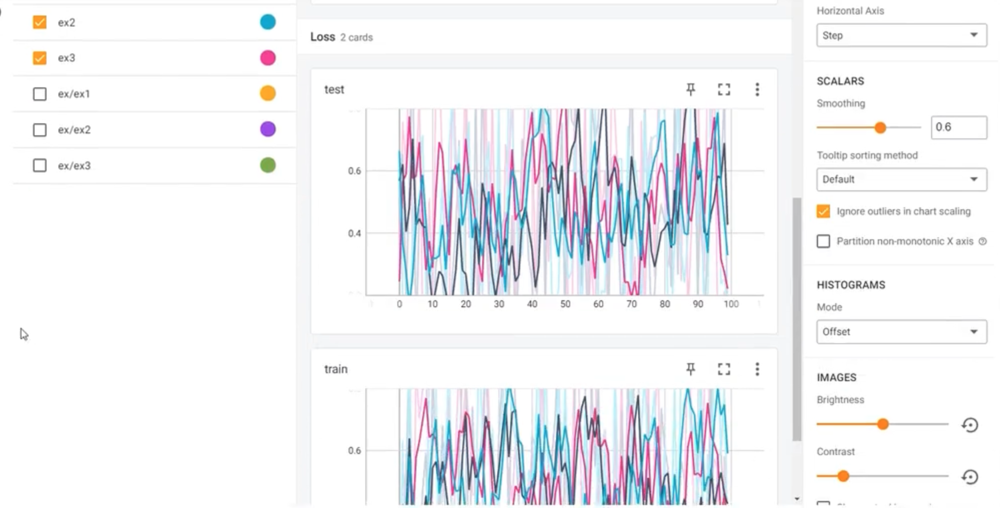

In [5]:
from tensorboard import notebook
notebook.list() # View open TensorBoard instances

Known TensorBoard instances:
  - port 6006: logdir logs (started 0:00:00 ago; pid 618)


In [6]:
from torch.utils.tensorboard import SummaryWriter
writer = SummaryWriter(logs_base_dir)
r = 5
for i in range(100):
    writer.add_scalars('run_14h', {'xsinx':i*np.sin(i/r),
                                    'xcosx':i*np.cos(i/r),
                                    'tanx': np.tan(i/r)}, i)
# run_14h안에 한번에 넣는 방법
writer.close()

In [7]:
from torch.utils.tensorboard import SummaryWriter
import numpy as np
writer = SummaryWriter(logs_base_dir)
for i in range(10):
    x = np.random.random(1000) # 1000개의 데이터 생성
    writer.add_histogram('distribution centers', x + i, i) # 분포 표현
# 1000개의 데이터가 들어간 10개 생성
writer.close()

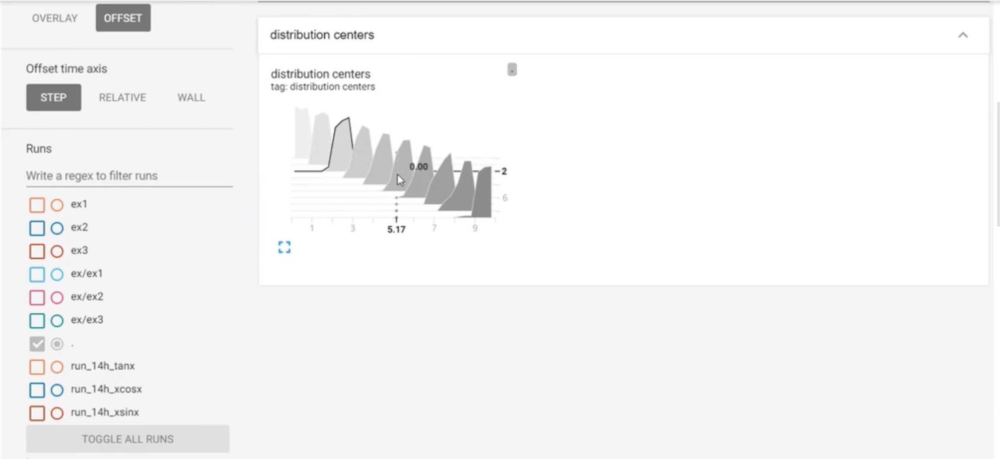

In [8]:
from torch.utils.tensorboard import SummaryWriter
import numpy as np

img_batch = np.zeros((16, 3, 100, 100))
for i in range(16):
    img_batch[i, 0] = np.arange(0, 10000).reshape(100, 100) / 10000 / 16 * i
    img_batch[i, 1] = (1 - np.arange(0, 10000).reshape(100, 100) / 10000) / 16 * i

writer = SummaryWriter(logs_base_dir)
writer.add_images('my_image_batch', img_batch, 0) # 이미지값을 일종의 array형태로 집어넣어준다
writer.close()

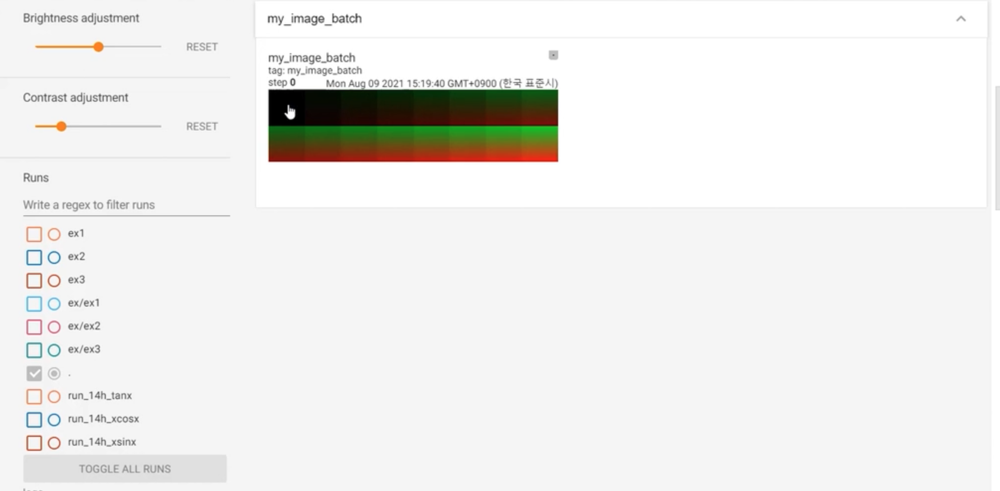

In [9]:
import torch
from torch.utils.tensorboard import SummaryWriter
vertices_tensor = torch.as_tensor([
    [1, 1, 1],
    [-1, -1, 1],
    [1, -1, -1],
    [-1, 1, -1],
], dtype=torch.float).unsqueeze(0)
colors_tensor = torch.as_tensor([
    [255, 0, 0],
    [0, 255, 0],
    [0, 0, 255],
    [255, 0, 255],
], dtype=torch.int).unsqueeze(0)
faces_tensor = torch.as_tensor([
    [0, 2, 3],
    [0, 3, 1],
    [0, 1, 2],
    [1, 3, 2],
], dtype=torch.int).unsqueeze(0)

writer = SummaryWriter(logs_base_dir)
writer.add_mesh('my_mesh', vertices=vertices_tensor, colors=colors_tensor, faces=faces_tensor)

writer.close()

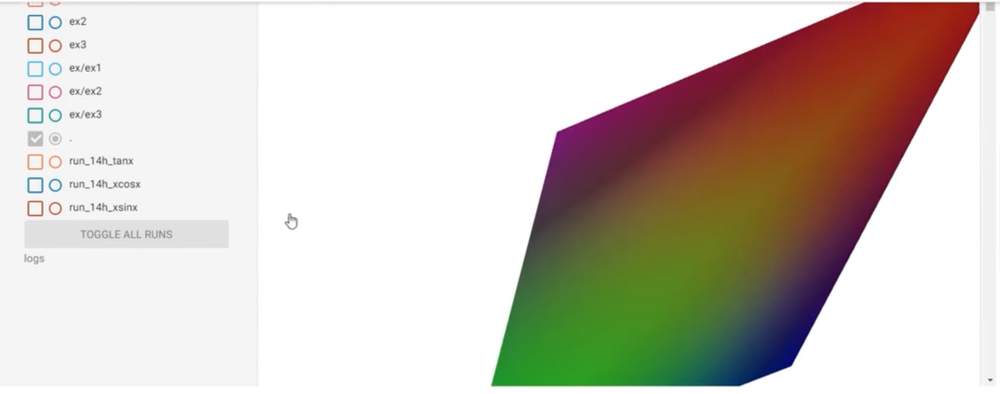
- 3d 형태로 구성되게 된다

In [10]:
from torch.utils.tensorboard import SummaryWriter
with SummaryWriter(logs_base_dir) as w:
    for i in range(5):
        w.add_hparams({'lr': 0.1*i, 'bsize': i},
                      {'hparam/accuracy': 10*i, 'hparam/loss': 10*i})

hyper parameter을 동시에 기록할 수 있다

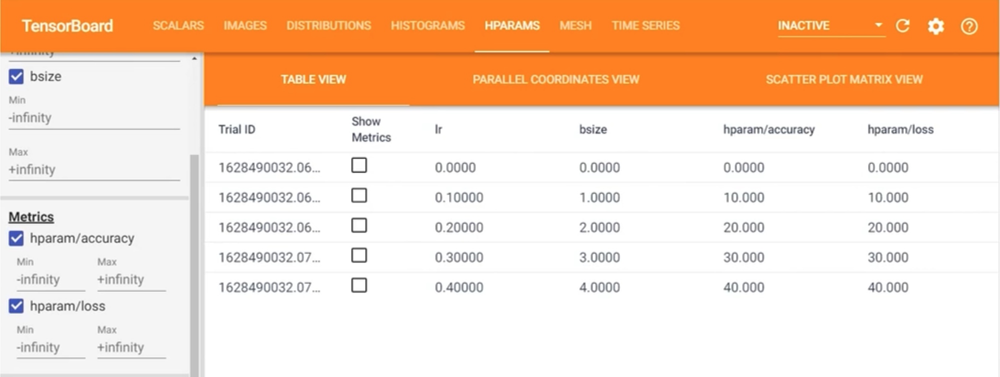